In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
import corner
import ellc
from ellc import lc

import edmcmc as edm
# import batman

In [2]:
# System parameters
r_1 = 0.04132231404  # units of semi-major axis
r_2 = 0.0011228161490683  # units of semi-major axis
incl = 89.45  # degrees
a = 24.2 # units of solar radii
e = 0.05
f_c = np.sqrt(e) * math.cos(np.deg2rad(-10))
f_s = np.sqrt(e) * math.sin(np.deg2rad(-10))
q = 0.0000291991764706  # mass ratio
shape_1 = "sphere"
shape_2 = "sphere"
period = 9.489  # days
t0 = 2460726.88970225  # start time

In [3]:
vsini_guess = 0.5  # km/s
lambda1_guess = 45  # degrees

planet_name = "HD-97658-b"
model_name = "updated-1"
csvfile = "../data/HD97658_2025Feb20.csv"
output_dir = "./edmcmc_output/"

df = pd.read_csv(csvfile, comment='#')
for col in ("ccfjdsum", "ccfrvmod", "dvrms"):
    if col not in df.columns:
        raise ValueError(f"Input CSV missing required column: {col}")

time_obs = df['ccfjdsum'].values.astype(float)  # times in days
rv_data = df['ccfrvmod'].values.astype(float)   # observed RV in km/s
rv_err = df['dvrms'].values.astype(float)       # RV uncertainties in km/s

In [ ]:
def loglikelihood(p, time, rv_obs, rv_err):
    vsini_mod, lambda1_mod = p  # free params

    rv_model, _ = ellc.rv(
        time,
        t_zero=t0,
        period=period,
        lambda_1=lambda1_mod,
        radius_1=r_1,
        radius_2=r_2,
        incl=incl,
        a=a,
        f_c=f_c,
        f_s=f_s,
        q=q,
        shape_1=shape_1,
        shape_2=shape_2,
        vsini_1=vsini_mod,
        flux_weighted=True,
        verbose=0
    )

    chi2 = np.sum((rv_obs - rv_model)**2 / (rv_err)**2)
    return -0.5 * chi2


# initial guess and step size
labels = ['v_sini', 'lambda']
p0 = [vsini_guess, lambda1_guess]  # initial params: vsini, lambda1
wid = [0.0001, 0.0001]         # step sizes
parinfo = [
    {   # parameter 0: vsini (km/s)
        'fixed': False,
        'limits': [max(0.0, vsini_guess - 0.5), vsini_guess + 1.5],  # ±0.5 km/s ()>=0)
        'limited': [True, True]
    },
    {   # parameter 1: lambda (degrees)
        'fixed': False,
        'limits': [lambda1_guess - 25.0, lambda1_guess + 25.0],  # ±25 degrees
        'limited': [True, True]
    },
]
ndim = len(p0)

*******************************************************************************************************
True False 1 10 1763661176.9862459 1763661176.935193 10000
*******************************************************************************************************
True False 2 10 1763661177.011191 1763661176.935193 10000
*******************************************************************************************************
True False 3 10 1763661177.0346155 1763661176.935193 10000
*******************************************************************************************************
True False 4 10 1763661177.0552878 1763661176.935193 10000
*******************************************************************************************************
True False 5 10 1763661177.0772147 1763661176.935193 10000
*******************************************************************************************************
True False 6 10 1763661177.0996256 1763661176.935193 10000
***********************

In [ ]:
# Run the MCMC
out = edm.edmcmc(
    loglikelihood,
    p0,
    wid,
    args=(time_obs, rv_data, rv_err),  # observed data
    parinfo=parinfo,
    nwalkers=10,  # usually 2-5x number of free params
    nlink=5000,  # number of steps
    nburnin=500,  # number of burn-in steps
    ncores=1,  # number of cores
    quiet=True
    # quiet=False
)

1.9999676210862252 +/- 4.7499409944761575e-05 ;     69.99395194316236 +/- 0.008482741970595988
<class 'edmcmc.mcmcstr'>
walker trace plot:HD-97658-b_updated-1_trace.pdf
corner plot:HD-97658-b_updated-1_corner.pdf
Best-fitting parameters saved to: HD-97658-b_updated-1_bestfit.csv
 Start ellc:lc
 N_obs  =           60
 t_obs(1)  =    2460727.0247022500     
 t_obs(N_obs)  =    2460726.7479607500     
 ellc: time_0 =    2460726.8897022498     
 ellc: p_anom =    9.4890000000000008     
 ellc: e =    5.00000007E-02 ; omega_0 =  -0.17453292519943292       radians
 F_rot,1 =   1.0000000000000000     
 F_rot,2 =   1.0000000000000000     
 Star 1, (H_0, H_1, u_H) =    0.00000000       0.00000000       0.00000000    
 Star 2, (H_0, H_1, u_H) =    0.00000000       0.00000000       0.00000000    
 Star 1: n_grid, shape =           16 sphere 
 Star 2: n_grid, shape =           16 sphere 
 Light travel time correction to T_0 =   -6.53950614E-04
 K_1 =    3.77193769E-03  km/s.
 K_2 =    129.179581  

<Figure size 700x700 with 0 Axes>

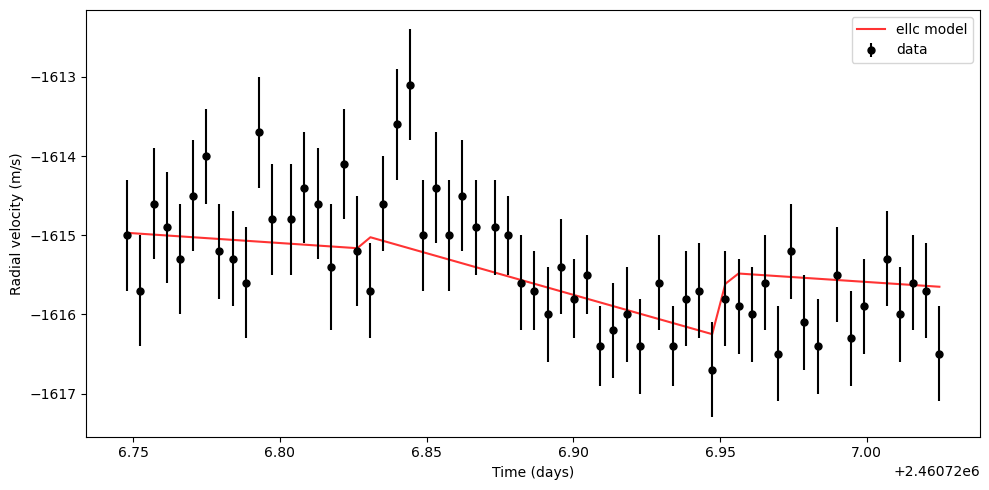

In [ ]:
# Output results
print(np.median(out.flatchains[:,0]), '+/-', np.std(out.flatchains[:,0]), ';    ', np.median(out.flatchains[:,1]), '+/-', np.std(out.flatchains[:,1]))
print(type(out))

# trace plot
fig1, axes1 = plt.subplots(ndim, figsize=(10, 1+2*ndim), sharex=True)
for i in range(ndim):
            ax = axes1[i]
            ax.plot(out.whichlink, out.flatchains[:,i], '.')
            # ax.set_xlim(0, len(samples))
            ax.set_ylabel(labels[i])
            # ax.yaxis.set_label_coords(-0.1, 0.5)
axes1[-1].set_xlabel("Link number")
# fig1_name = output_dir+planet_name+'_'+model_name+'_trace.pdf'
fig1_name = output_dir+planet_name+'_'+model_name+'_trace.pdf'
fig1.savefig(fig1_name)
print('walker trace plot:'+fig1_name)
plt.close(fig1)

# corner plot
fig2 = plt.figure(figsize=(1+3*ndim,1+3*ndim))
fig2 = corner.corner(out.flatchains,labels=labels)
# fig2_name = output_dir+planet_name+'_'+model_name+'_corner.pdf'
fig2_name = output_dir+planet_name+'_'+model_name+'_corner.pdf'
fig2.savefig(fig2_name)
print('corner plot:'+fig2_name)
plt.close(fig2)

# Save best-fitting parameters to CSV
bestfits = {
    'parameter': ['vsin_i', 'lambda'],
    'median': [np.median(out.flatchains[:, 0]), np.median(out.flatchains[:, 1])],
    'std': [np.std(out.flatchains[:, 0]), np.std(out.flatchains[:, 1])]
}

df_best = pd.DataFrame(bestfits)
csv_name = output_dir+planet_name + '_' + model_name + '_bestfit.csv'
df_best.to_csv(csv_name, index=False)

print(f"Best-fitting parameters saved to: {csv_name}")

# best-fitting model
best_vsini = np.median(out.flatchains[:, 0])
best_lambda = np.median(out.flatchains[:, 1])
rv_call = ellc.rv(
    time_obs,
    t_zero=t0,
    period=period,
    lambda_1=best_lambda,
    radius_1=r_1,
    radius_2=r_2,
    incl=incl,
    a=a,
    f_c=f_c,
    f_s=f_s,
    q=q,
    shape_1=shape_1,
    shape_2=shape_2,
    vsini_1=best_vsini,
    flux_weighted=True
)
star_rv = np.asarray(rv_call[0])

sys_offset = np.median(rv_data) - np.median(star_rv)
star_rv += sys_offset

fig3 = plt.figure(figsize=(10, 5))
ax3 = fig3.add_subplot(111)
ax3.errorbar(time_obs, rv_data * 1e3, yerr=rv_err * 1e3, fmt='o', ms=5, c='k', label='data', zorder=5)
ax3.plot(time_obs, star_rv * 1e3, '-', lw=1.5, alpha=0.8, c='red', label='ellc model')
ax3.set_xlabel('Time (days)')
ax3.set_ylabel('Radial velocity (m/s)')
ax3.legend()
plt.tight_layout()

fig3_name = output_dir + planet_name + '_' + model_name + '_rv_model.pdf'
fig3.savefig(fig3_name)
print('bestmodel plot:' + fig3_name)
plt.show()
plt.close(fig3)